In [1]:
#required libraries
!pip install librosa numpy pandas matplotlib scipy scikit-learn

import os
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy import signal
import soundfile as sf

# Set random seed for reproducibility
np.random.seed(42)

# Create directories for outputs
os.makedirs('processed_audio', exist_ok=True)
os.makedirs('augmented_audio', exist_ok=True)

In [2]:
# ============ STEP 1: UPLOAD YOUR AUDIO FILES ============
# In Colab, mount Google Drive or upload files
from google.colab import files

print("Upload your audio files (approve_*.wav, confirm_*.wav):")
uploaded = files.upload()

# Create a folder to store uploaded files
os.makedirs('recordings', exist_ok=True)
for filename in uploaded.keys():
    os.rename(filename, f'recordings/{filename}')

print(f"Uploaded files: {os.listdir('recordings')}")

Upload your audio files (approve_*.wav, confirm_*.wav):


Saving approve - alli.wav to approve - alli.wav
Saving approve - ange.wav to approve - ange.wav
Saving approve - elissa.wav to approve - elissa.wav
Saving approve - terry.wav to approve - terry.wav
Saving confirm - alli.wav to confirm - alli.wav
Saving confirm - ange.wav to confirm - ange.wav
Saving confirm - elissa.wav to confirm - elissa.wav
Saving confirm - terry.wav to confirm - terry.wav
Uploaded files: ['confirm - elissa.wav', 'confirm - terry.wav', 'approve - alli.wav', 'approve - terry.wav', 'confirm - alli.wav', 'confirm - ange.wav', 'approve - ange.wav', 'approve - elissa.wav']



=== VISUALIZING ALL AUDIO SAMPLES ===

--- Processing: approve - alli.wav ---


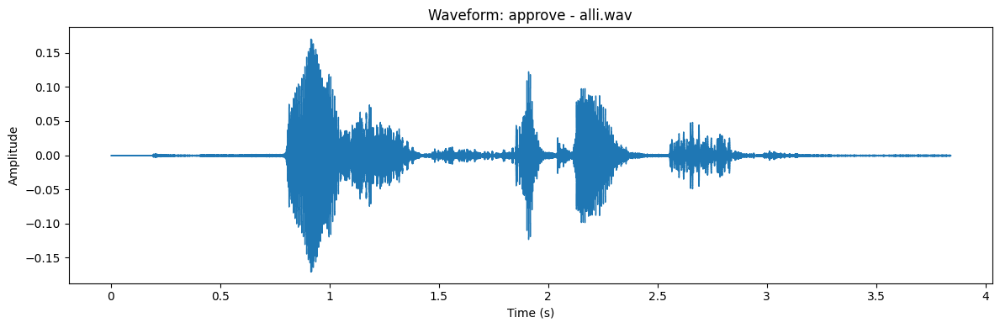

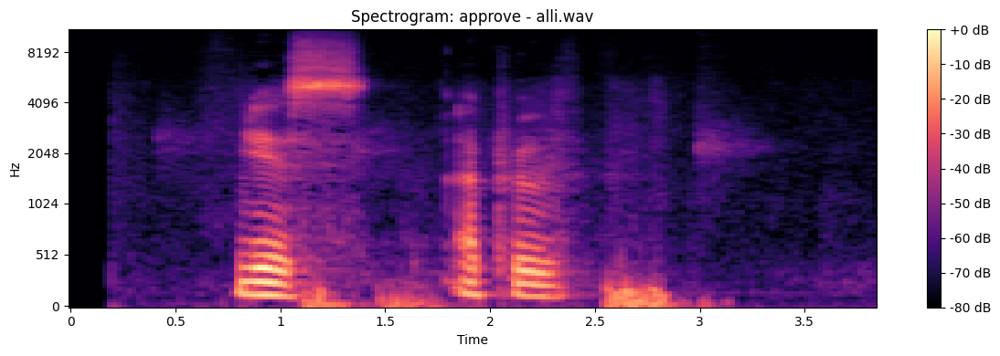


--- Processing: approve - ange.wav ---


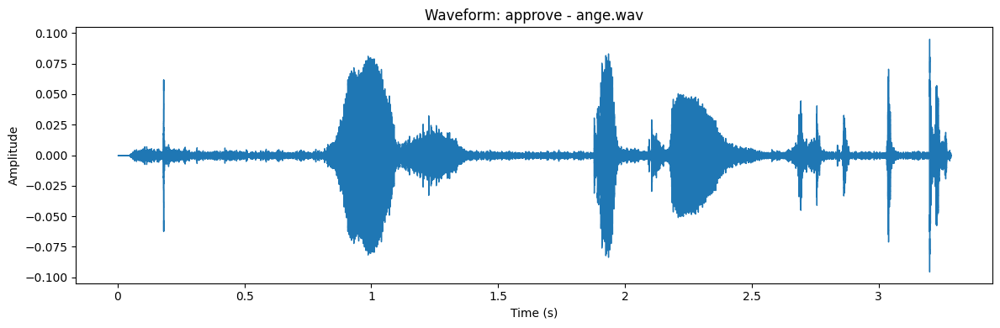

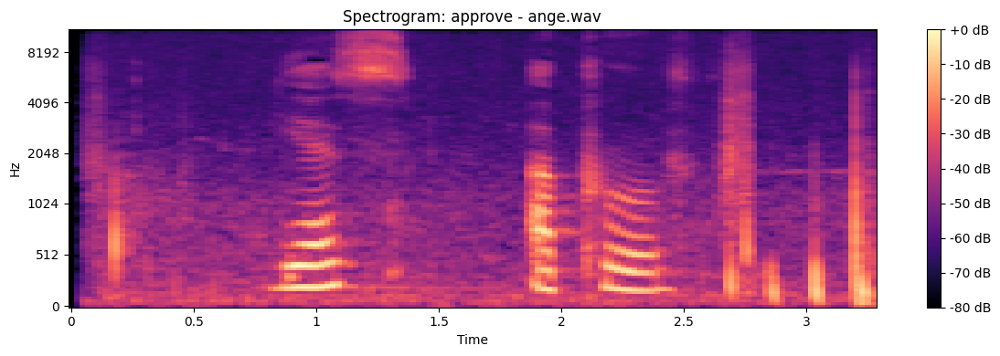


--- Processing: approve - elissa.wav ---


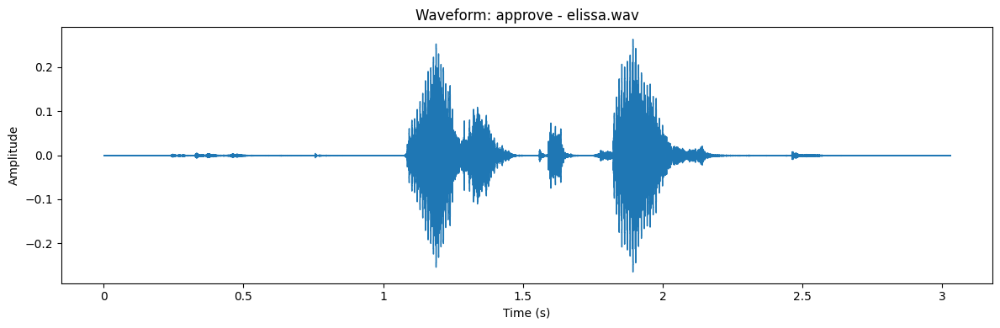

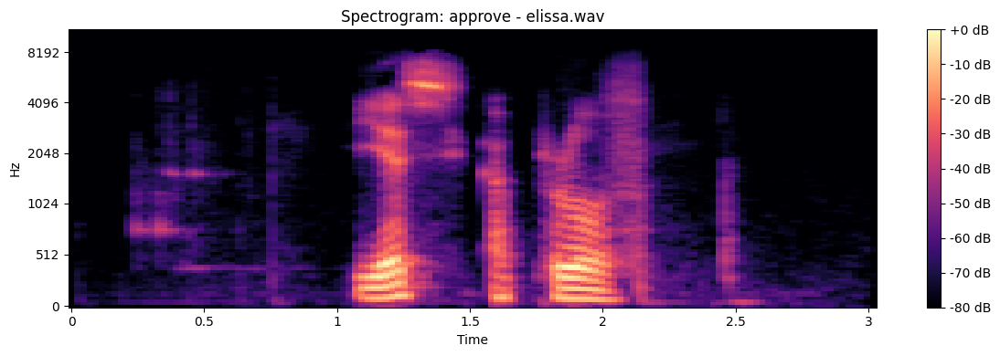


--- Processing: approve - terry.wav ---


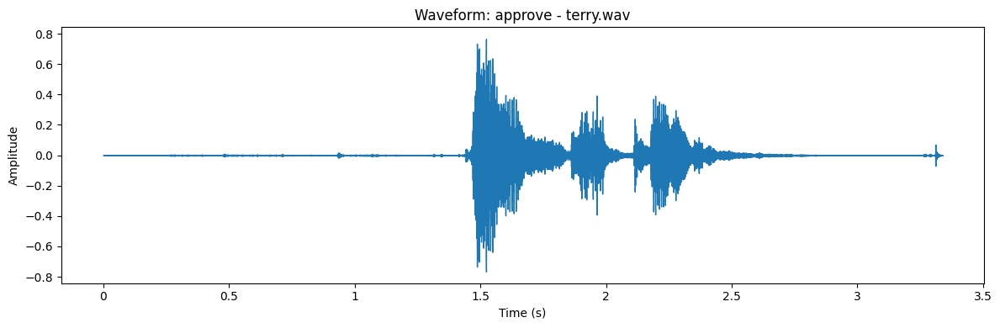

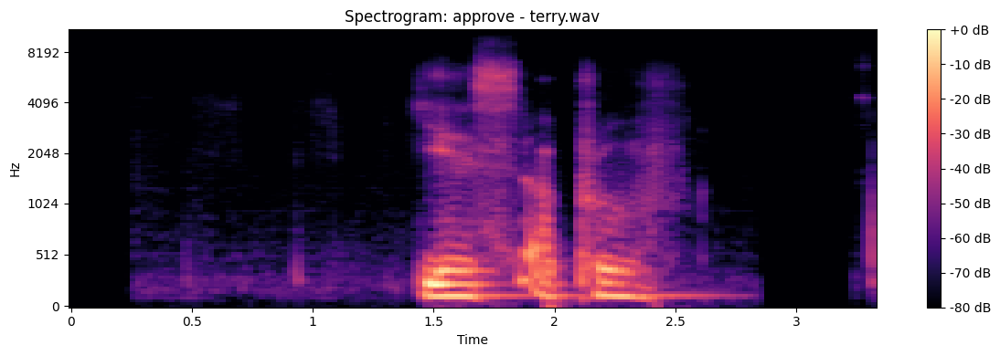


--- Processing: confirm - alli.wav ---


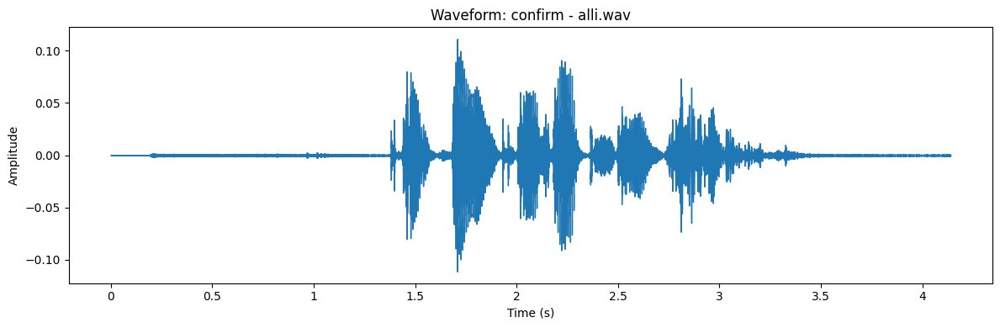

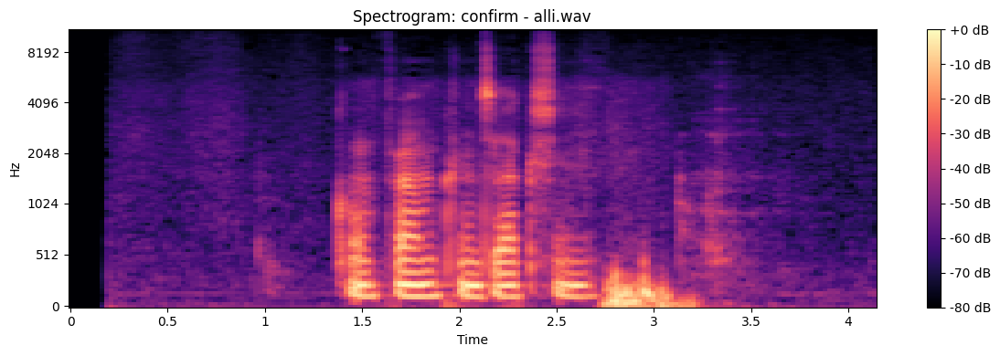


--- Processing: confirm - ange.wav ---


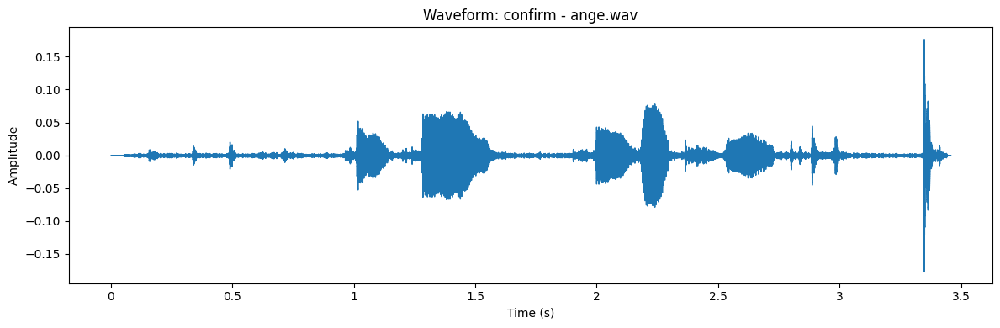

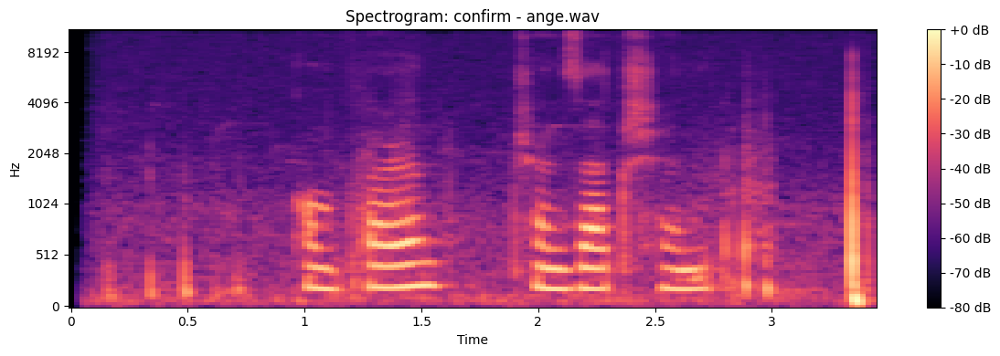


--- Processing: confirm - elissa.wav ---


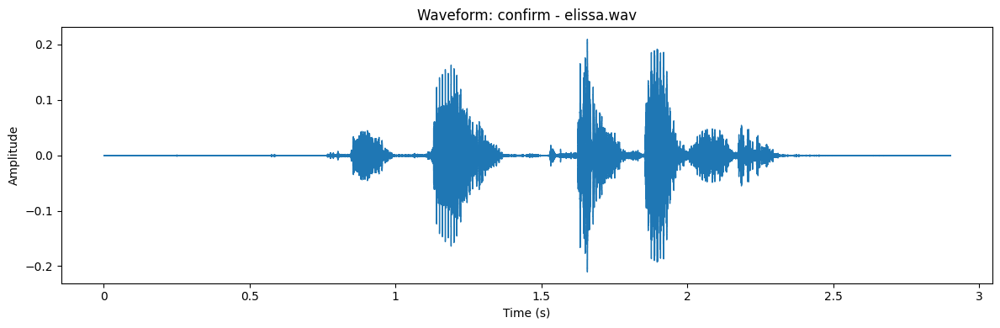

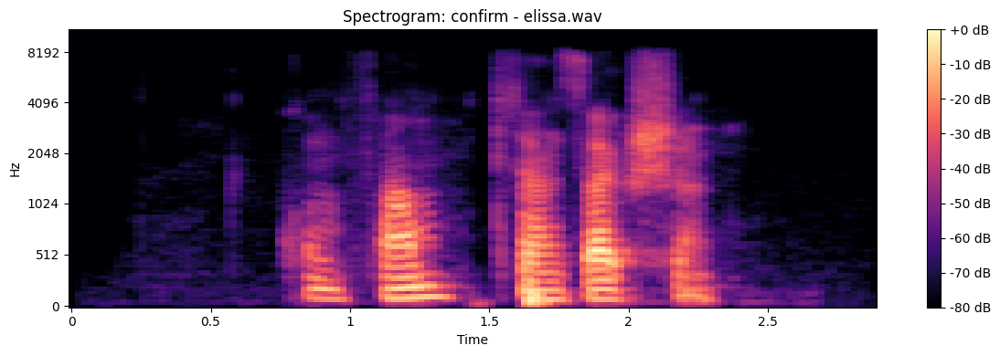


--- Processing: confirm - terry.wav ---


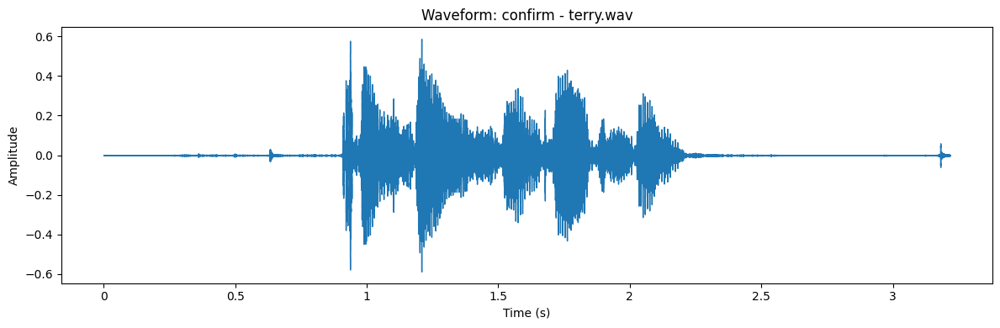

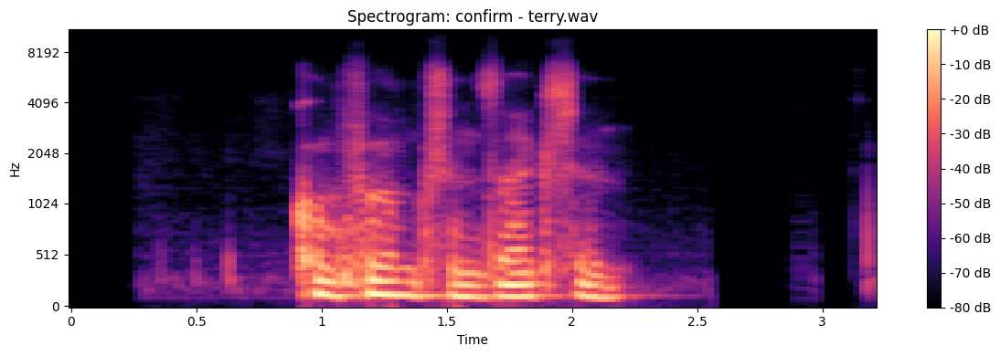

In [3]:
# ============ STEP 2: LOAD AND VISUALIZE AUDIO ============
def load_and_plot_waveform(filepath, sr=22050):
    """Load audio and display waveform"""
    y, sr = librosa.load(filepath, sr=sr)
    plt.figure(figsize=(12, 4))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform: {os.path.basename(filepath)}')
    plt.ylabel('Amplitude')
    plt.xlabel('Time (s)')
    plt.tight_layout()
    plt.show()
    return y, sr

def plot_spectrogram(y, sr, title):
    """Display spectrogram"""
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_db = librosa.power_to_db(S, ref=np.max)
    plt.figure(figsize=(12, 4))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Load and visualize ALL audio samples
print("\n=== VISUALIZING ALL AUDIO SAMPLES ===")
for filename in sorted(os.listdir('recordings')):
    if filename.endswith('.wav'):
        print(f"\n--- Processing: {filename} ---")
        sample_path = f'recordings/{filename}'
        y, sr = load_and_plot_waveform(sample_path)
        plot_spectrogram(y, sr, f'Spectrogram: {filename}')



=== APPLYING PREPROCESSING & AUGMENTATIONS ===

--- Processing: approve - alli.wav ---
Original length: 3.84s → Trimmed length: 2.07s


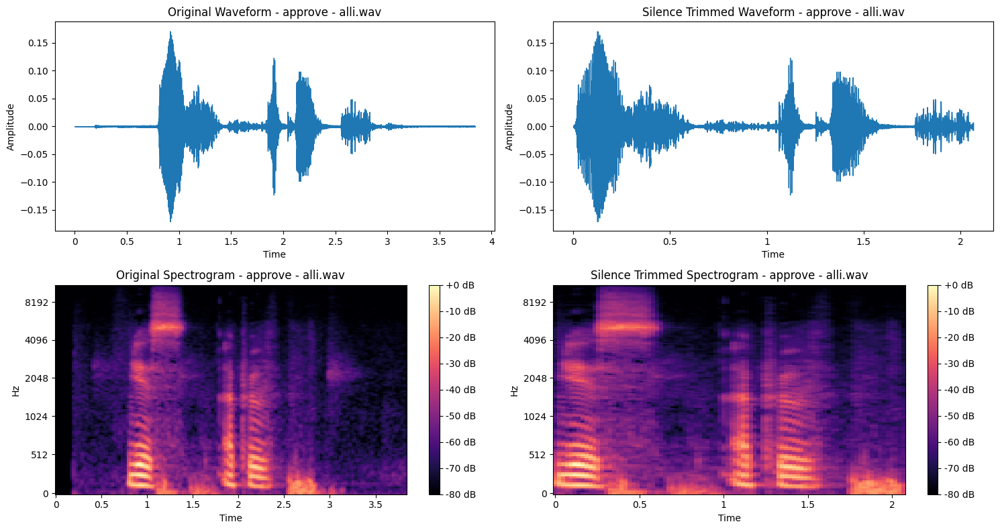

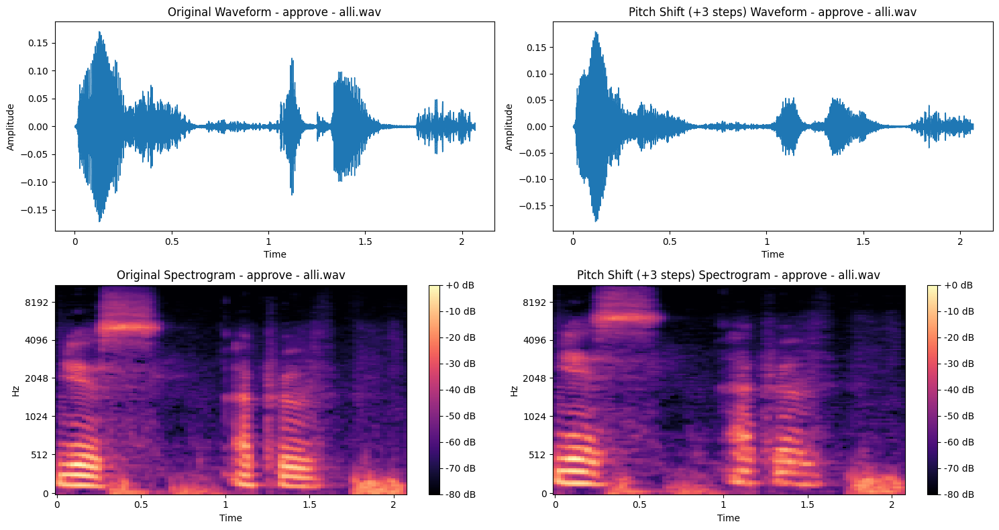

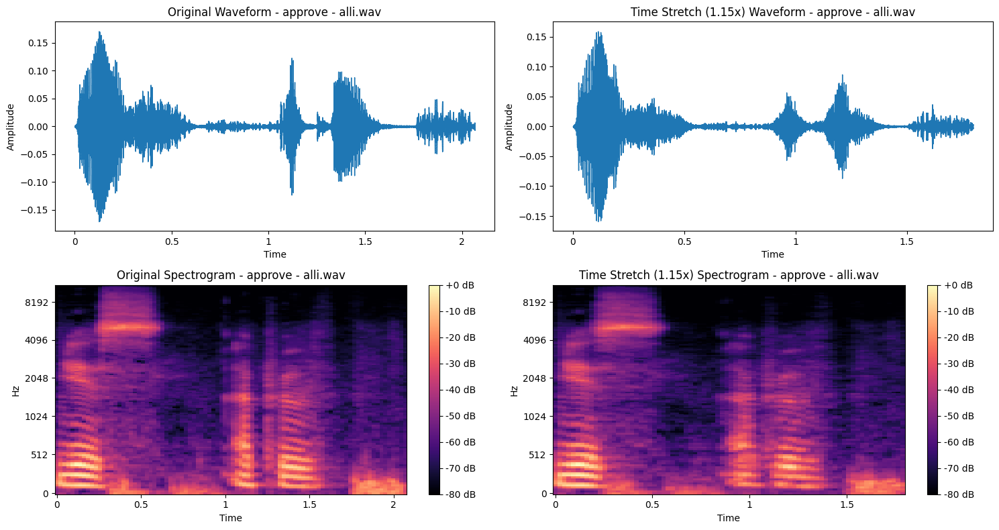

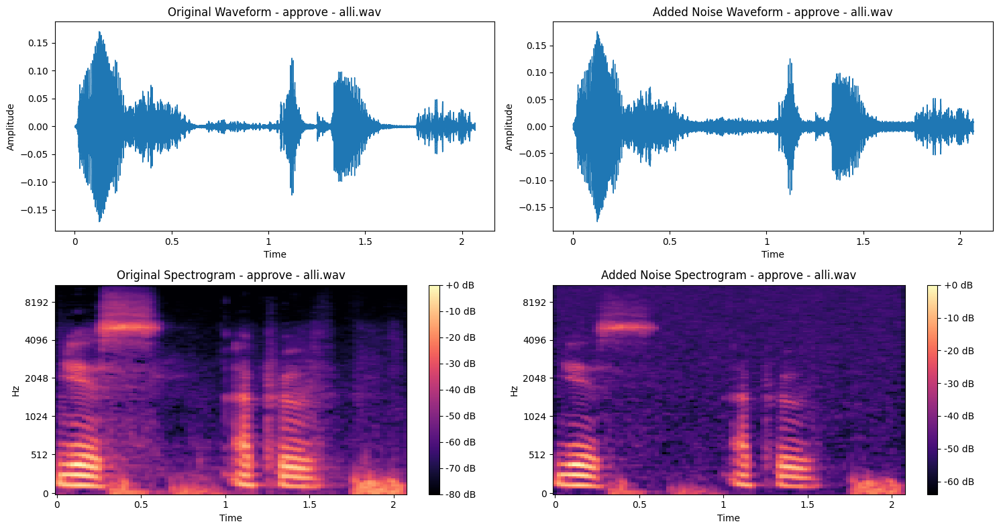

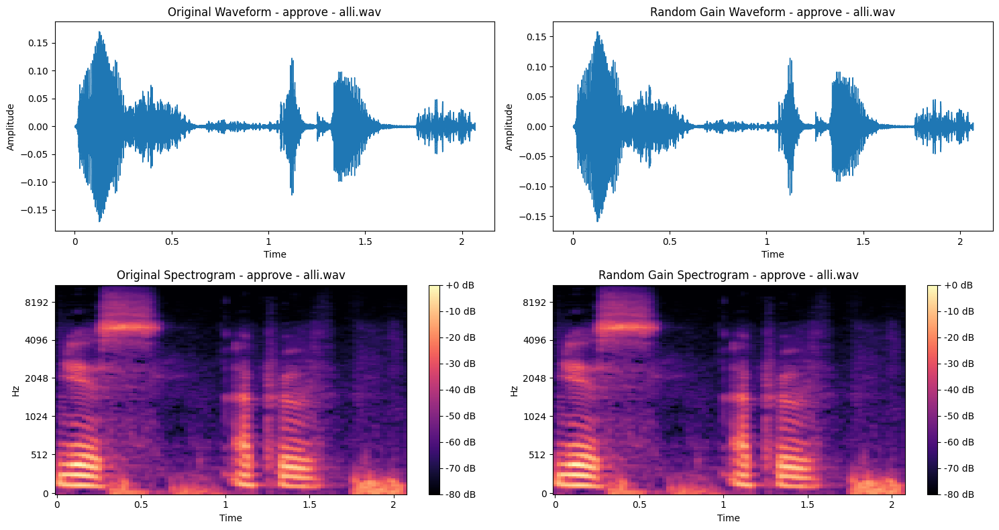

✓ Augmented: approve - alli.wav (4 variations created)

--- Processing: approve - ange.wav ---
Original length: 3.29s → Trimmed length: 3.15s


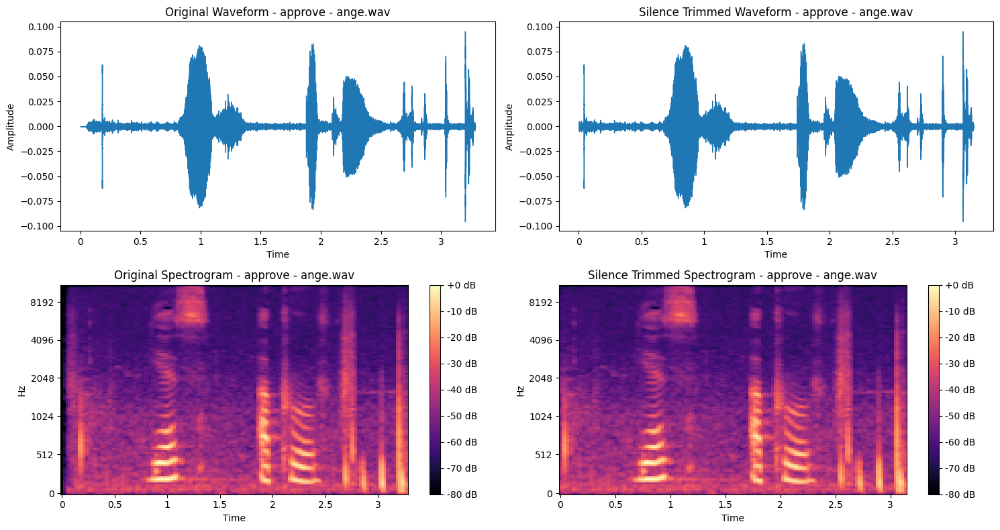

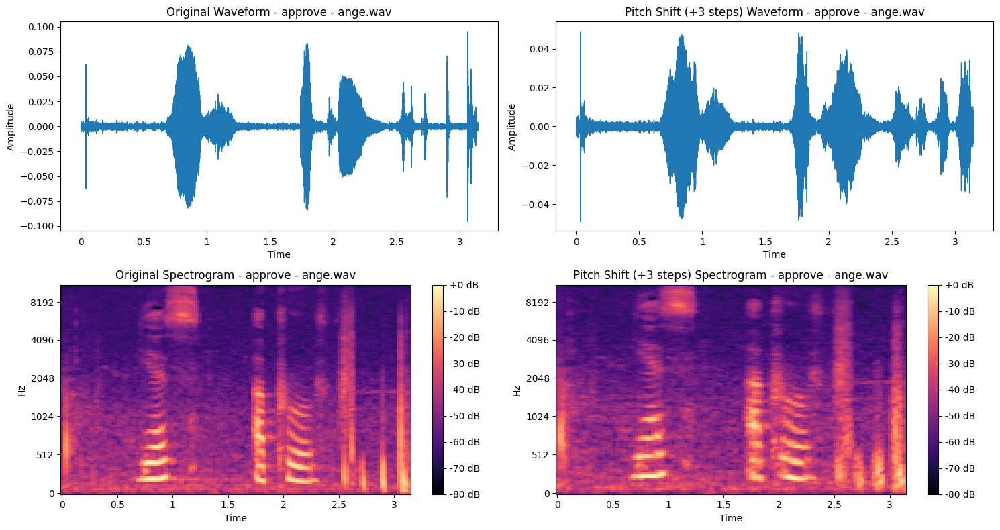

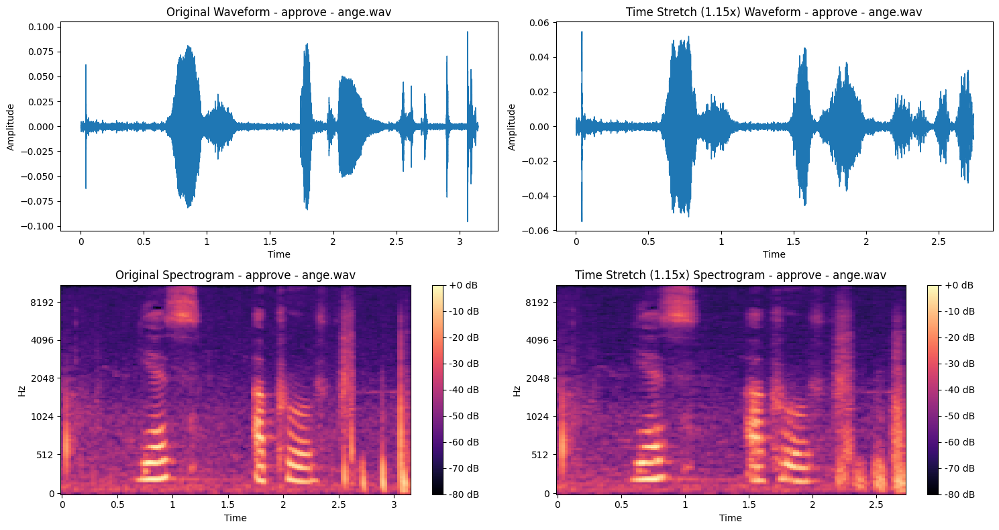

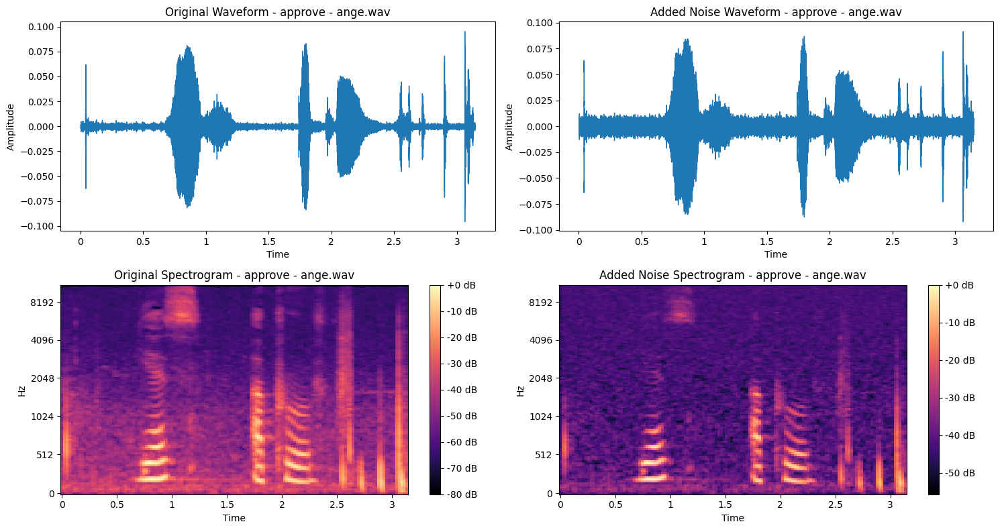

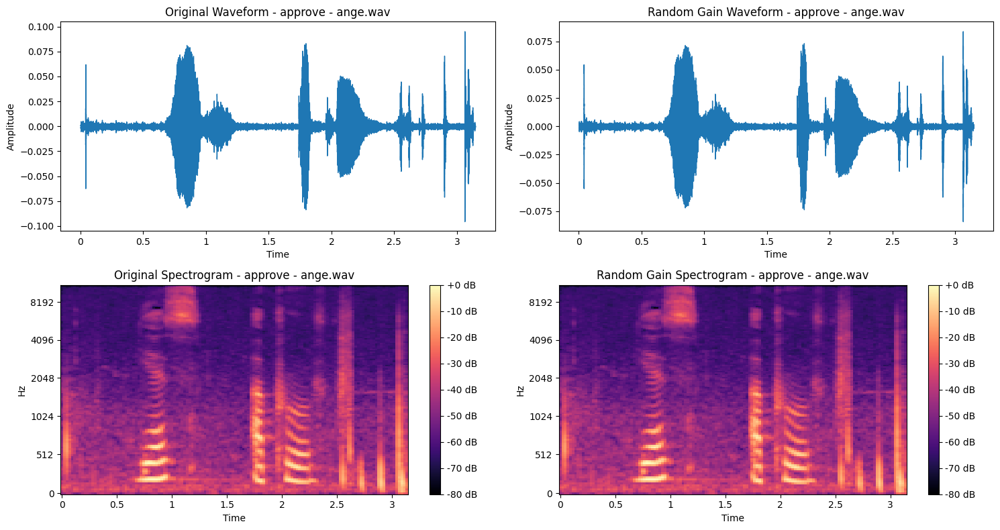

✓ Augmented: approve - ange.wav (4 variations created)

--- Processing: approve - elissa.wav ---
Original length: 3.03s → Trimmed length: 1.00s


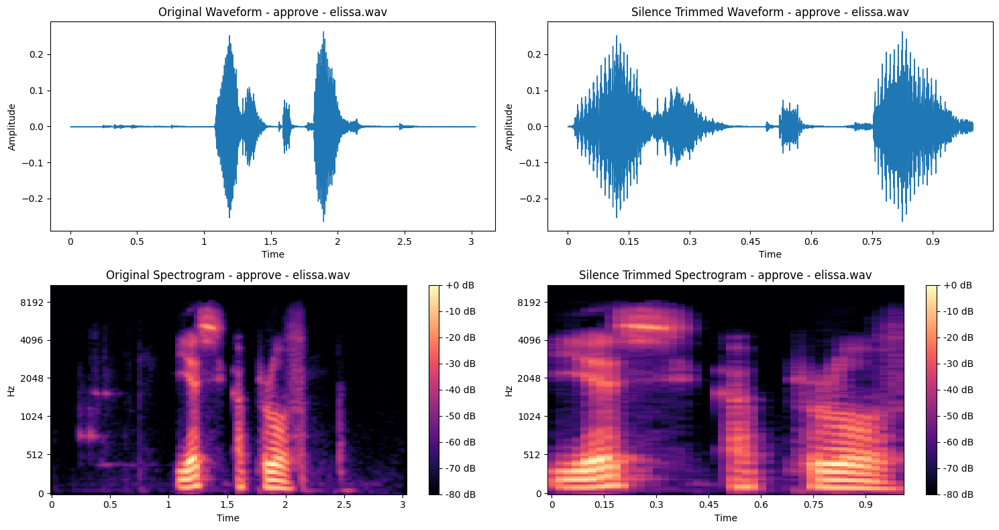

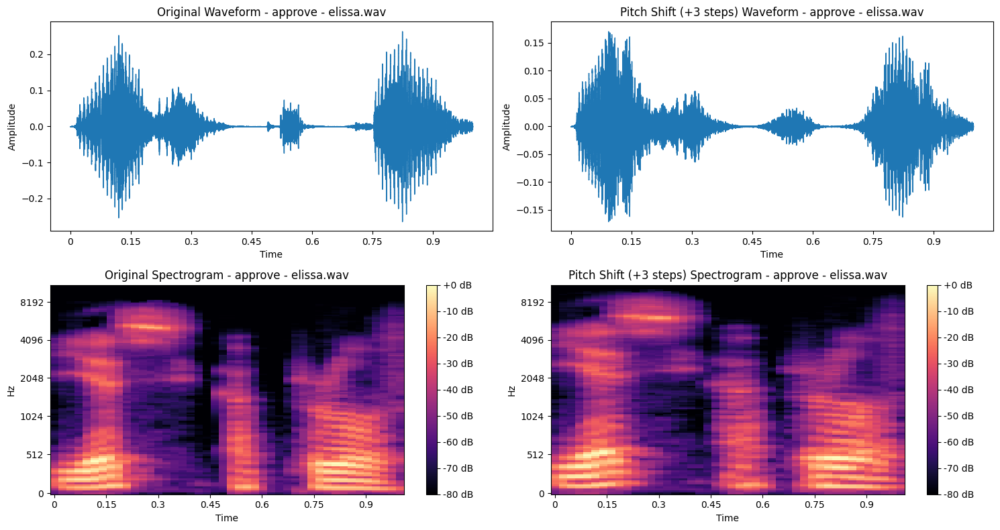

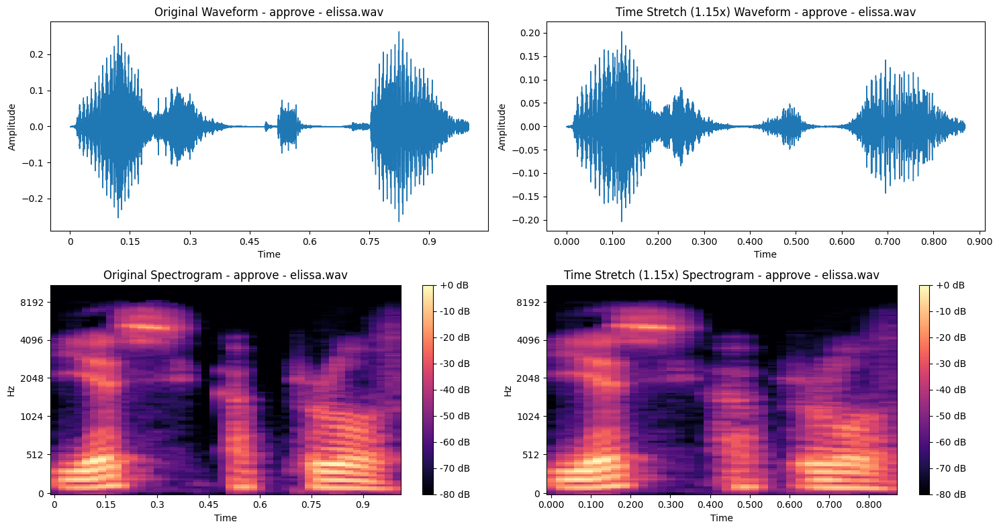

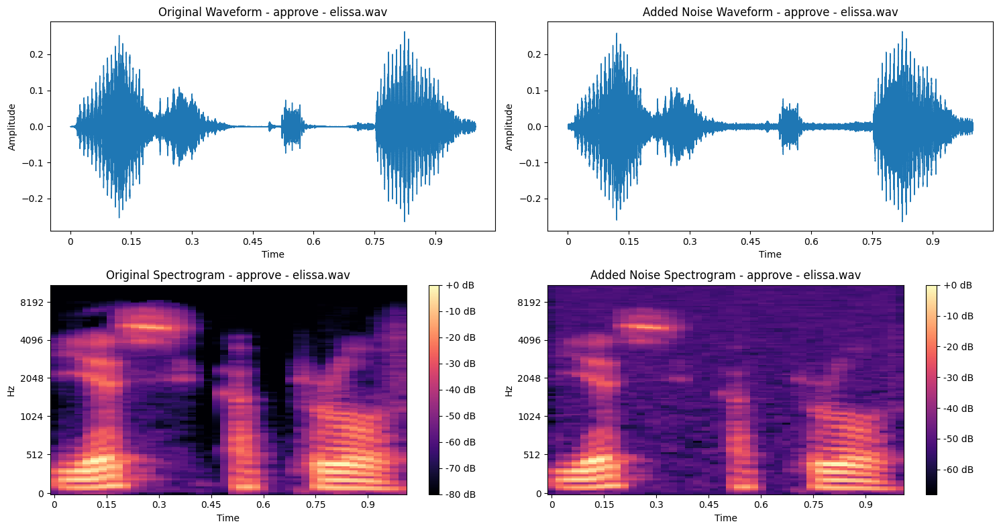

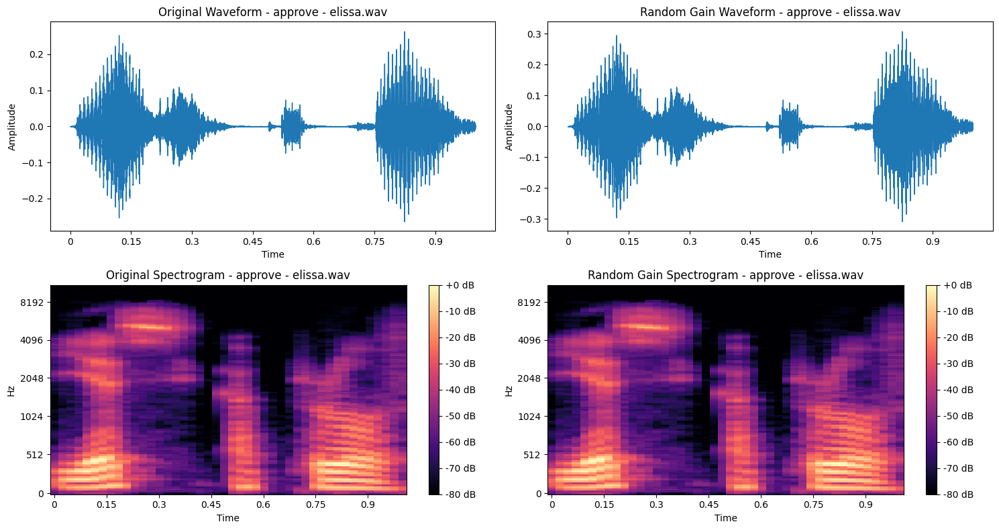

✓ Augmented: approve - elissa.wav (4 variations created)

--- Processing: approve - terry.wav ---
Original length: 3.34s → Trimmed length: 0.98s


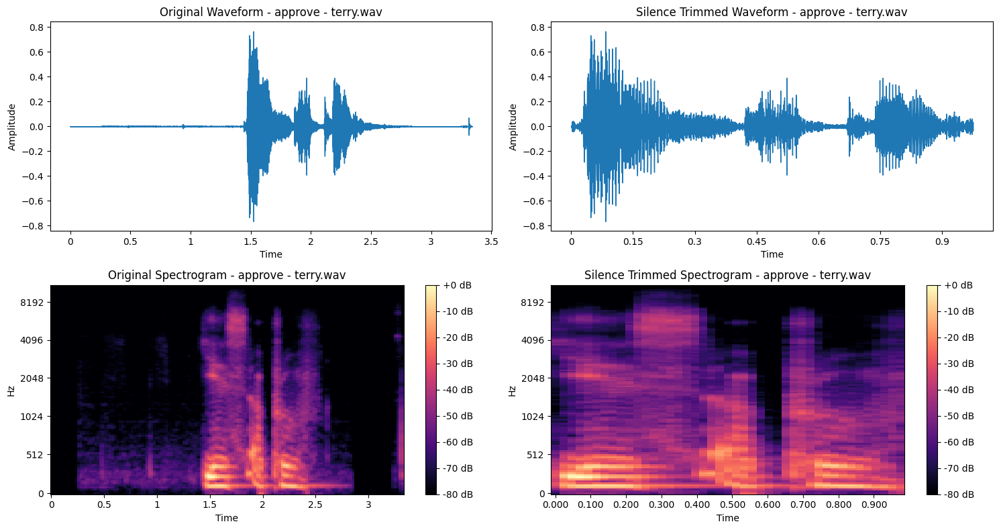

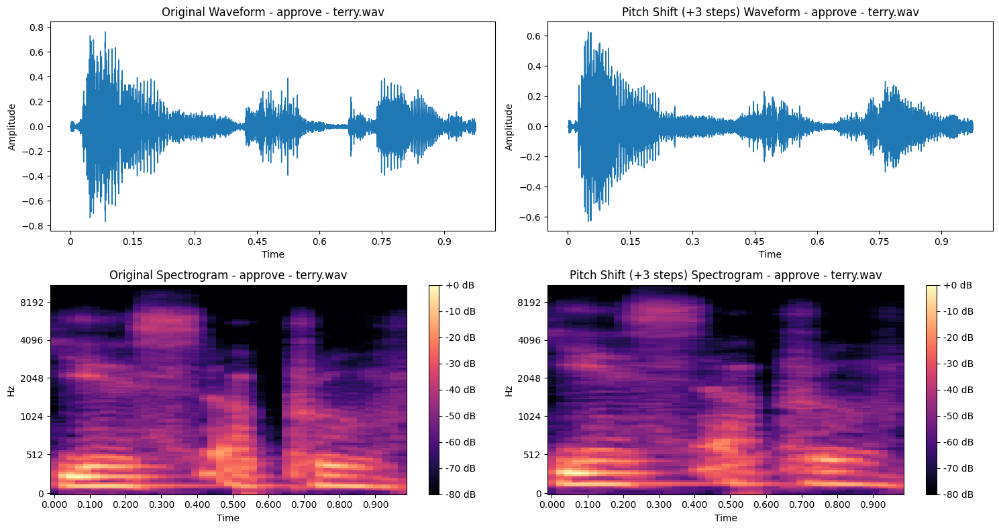

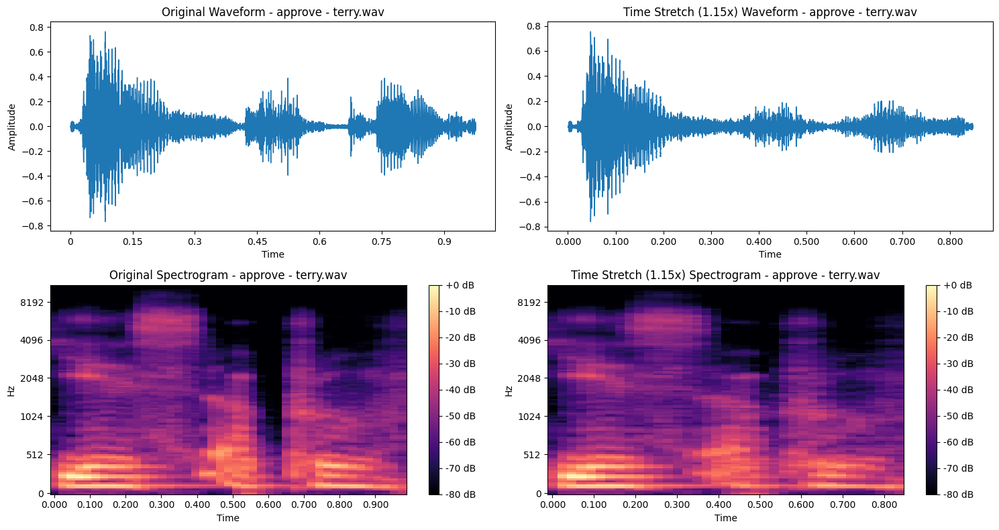

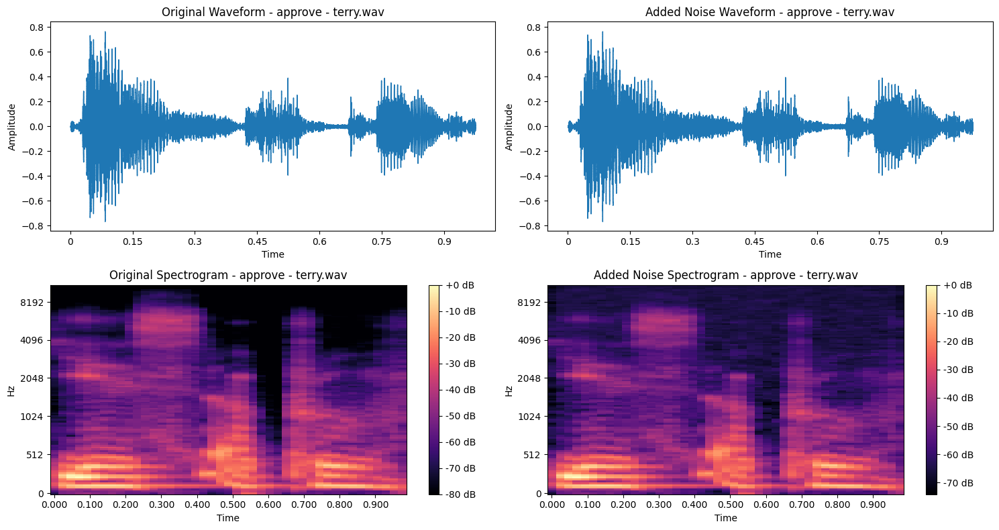

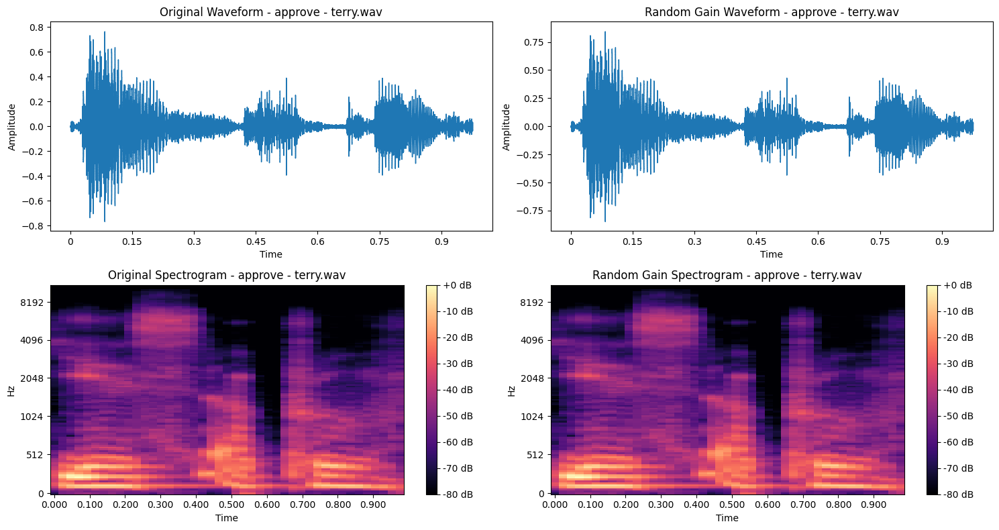

✓ Augmented: approve - terry.wav (4 variations created)

--- Processing: confirm - alli.wav ---
Original length: 4.14s → Trimmed length: 1.86s


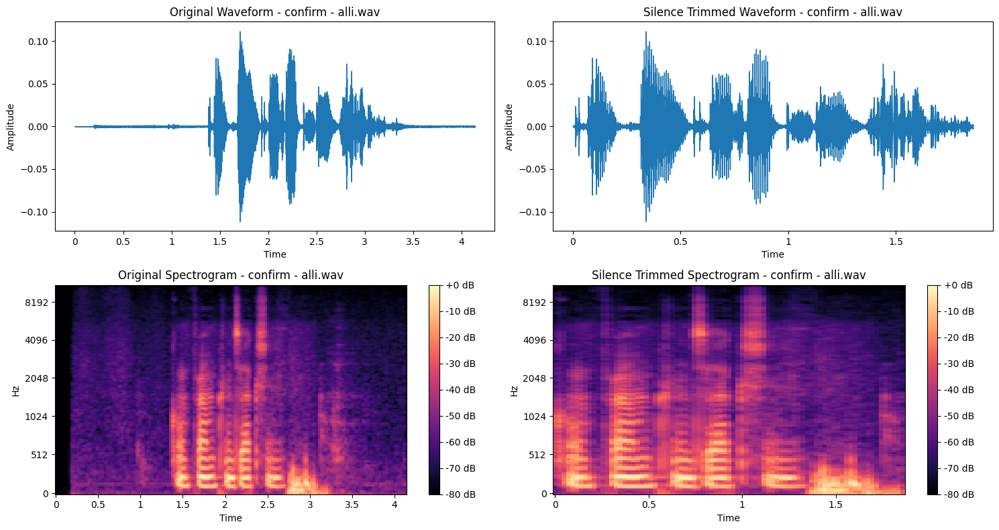

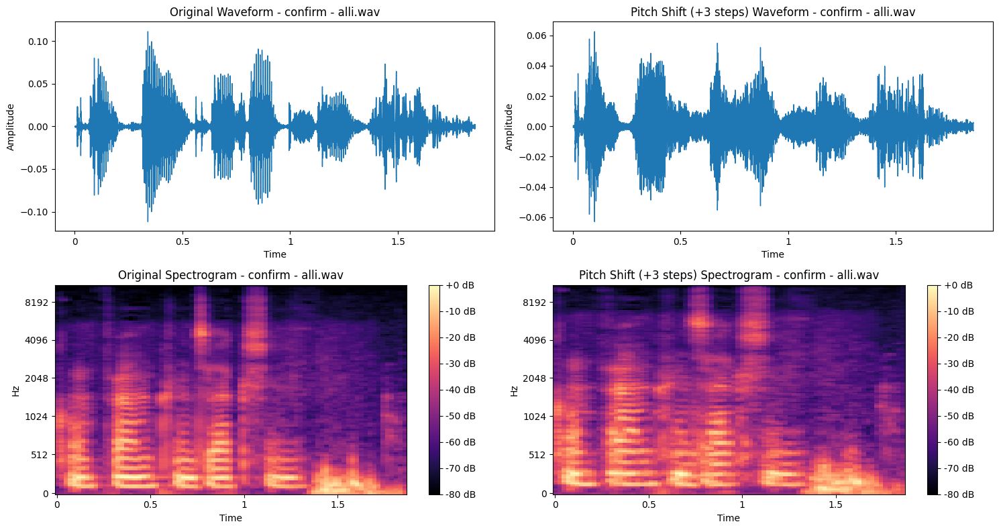

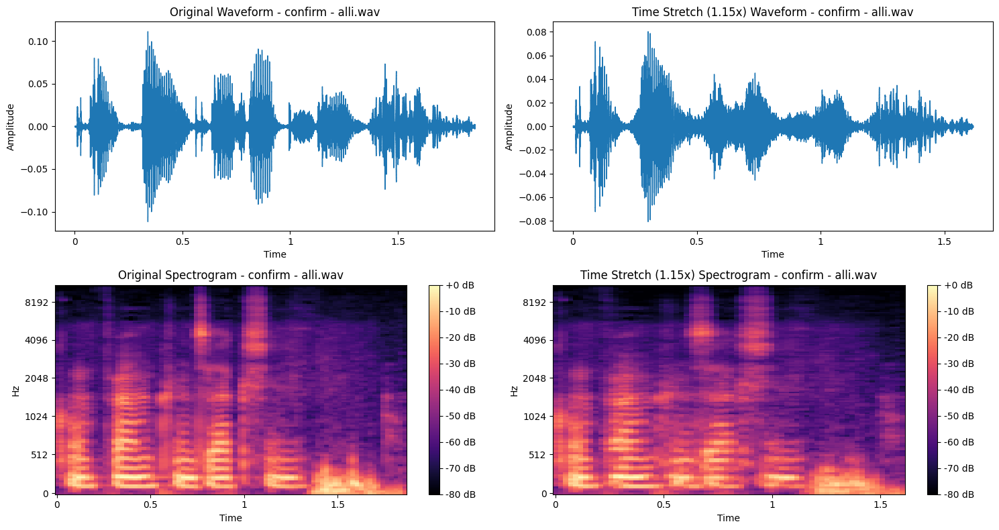

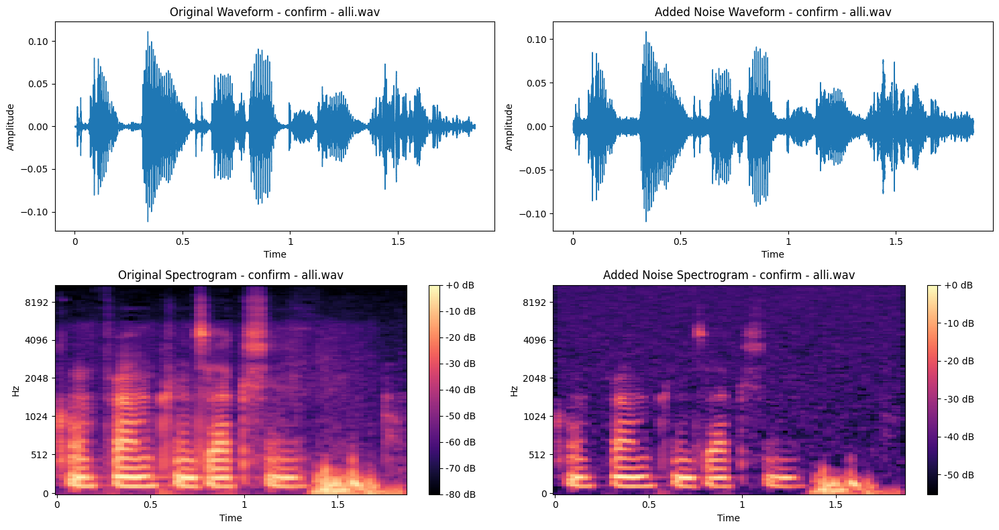

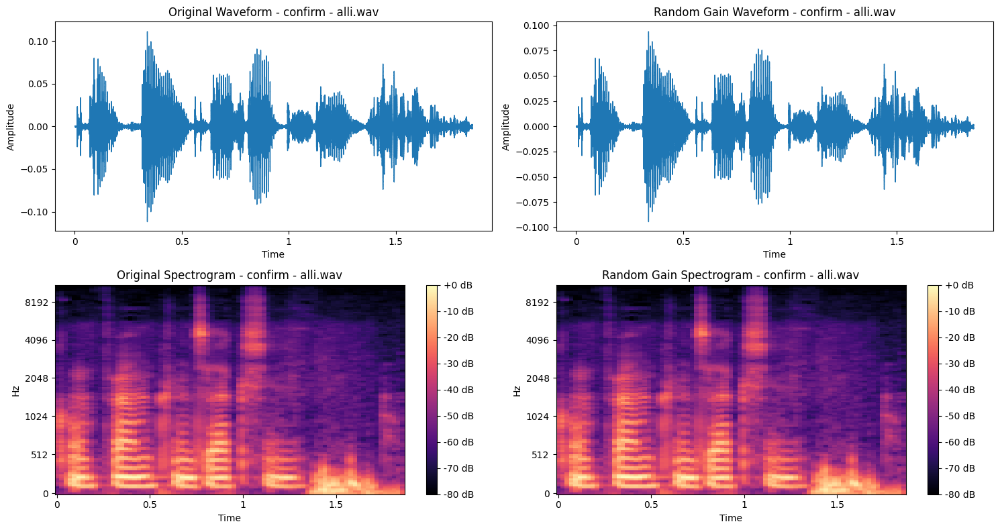

✓ Augmented: confirm - alli.wav (4 variations created)

--- Processing: confirm - ange.wav ---
Original length: 3.46s → Trimmed length: 2.97s


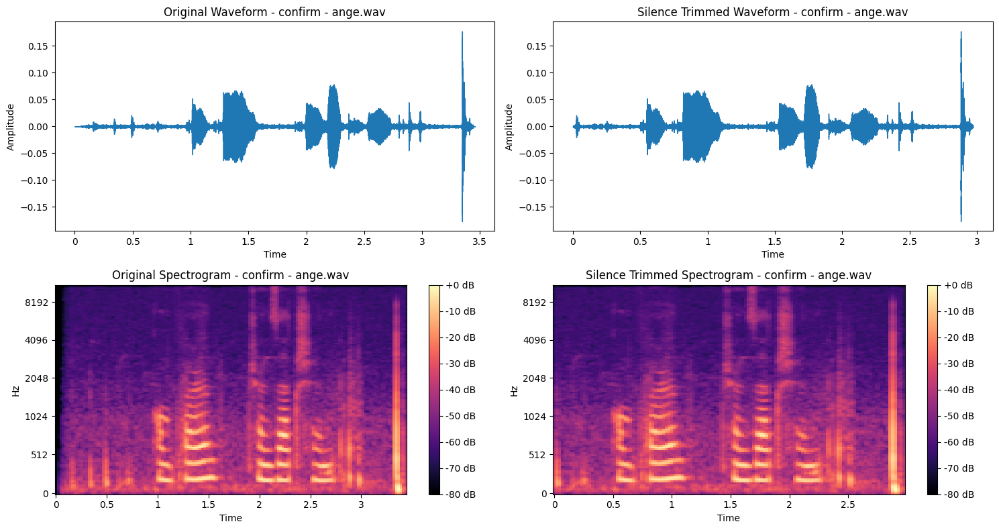

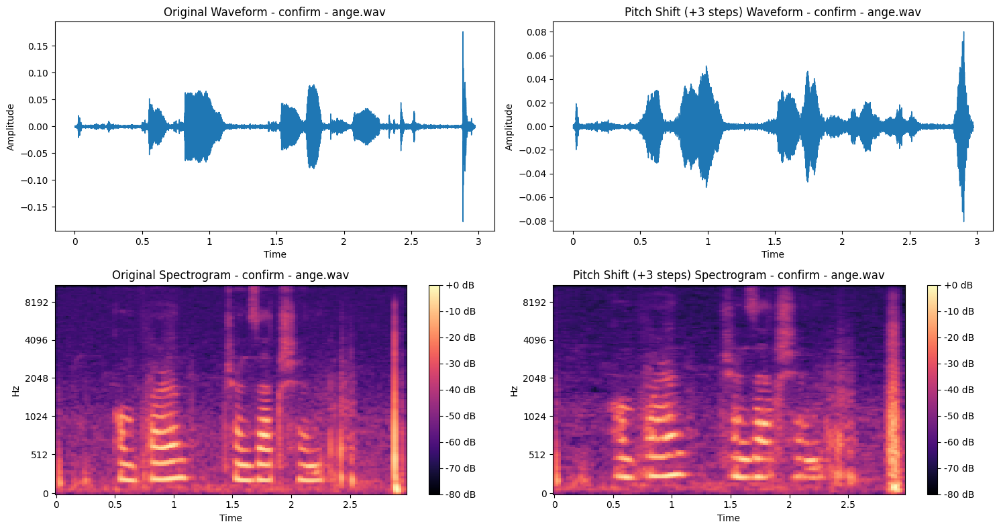

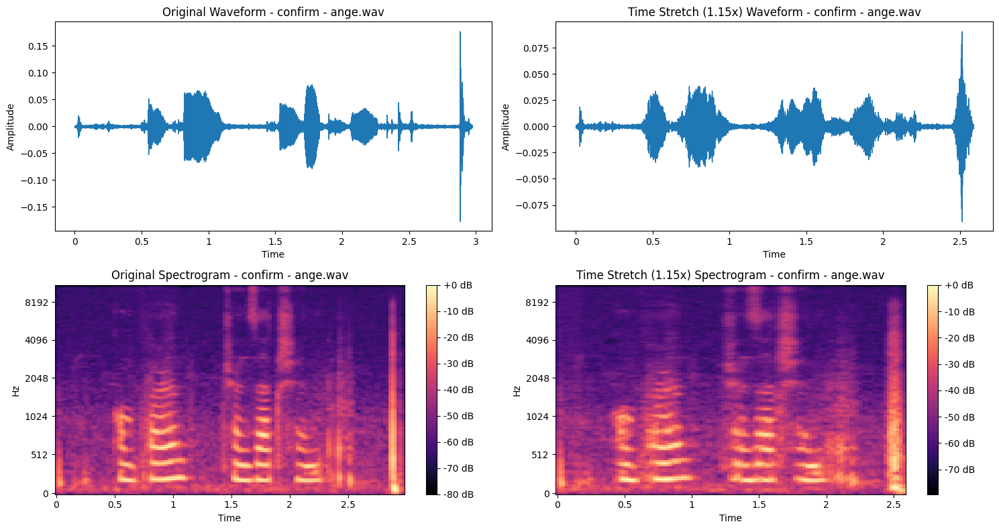

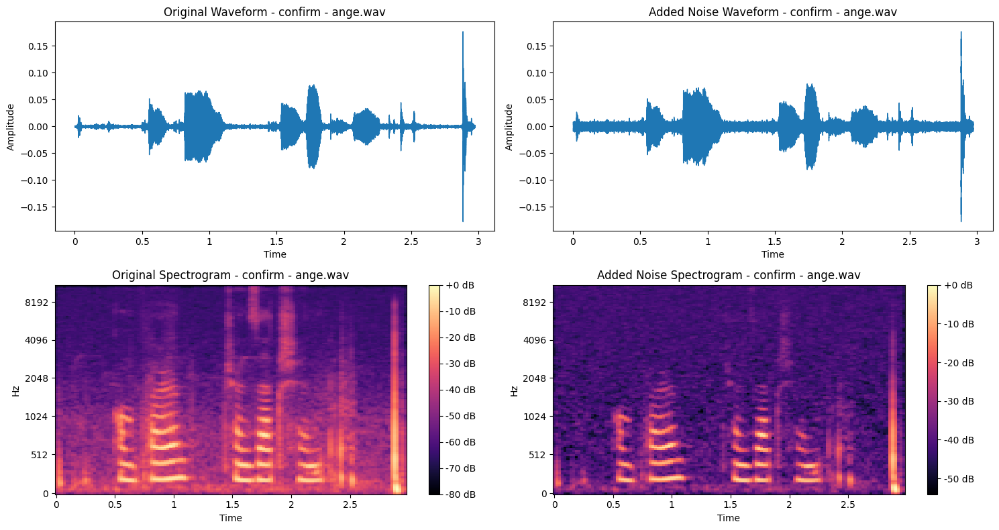

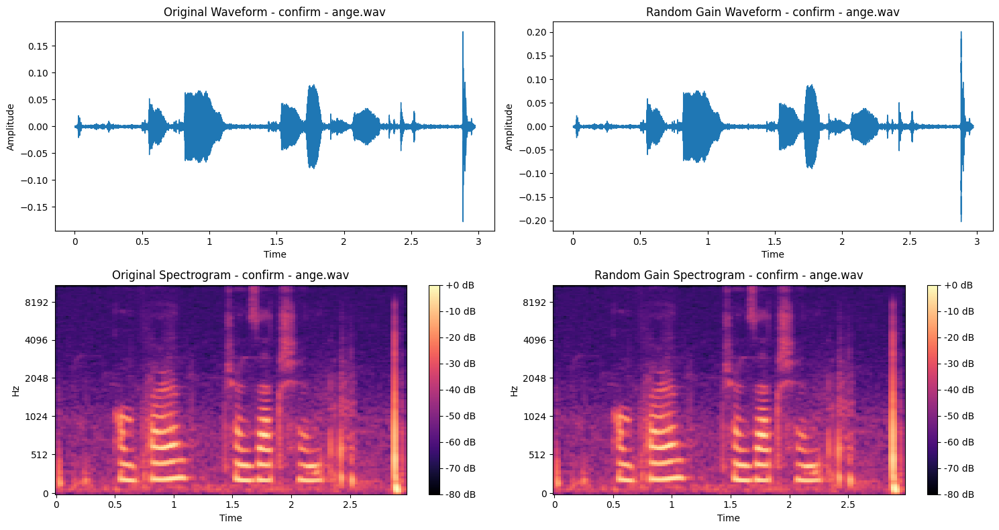

✓ Augmented: confirm - ange.wav (4 variations created)

--- Processing: confirm - elissa.wav ---
Original length: 2.90s → Trimmed length: 1.46s


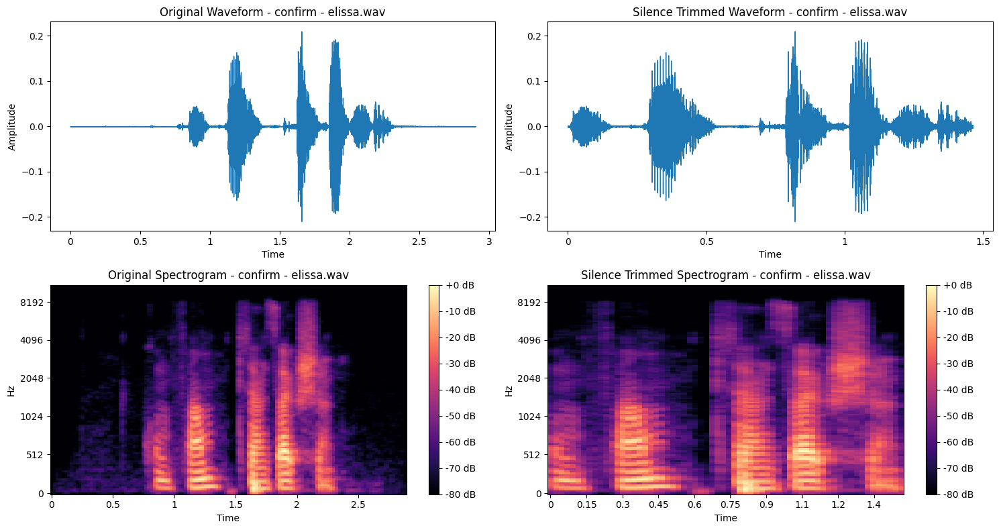

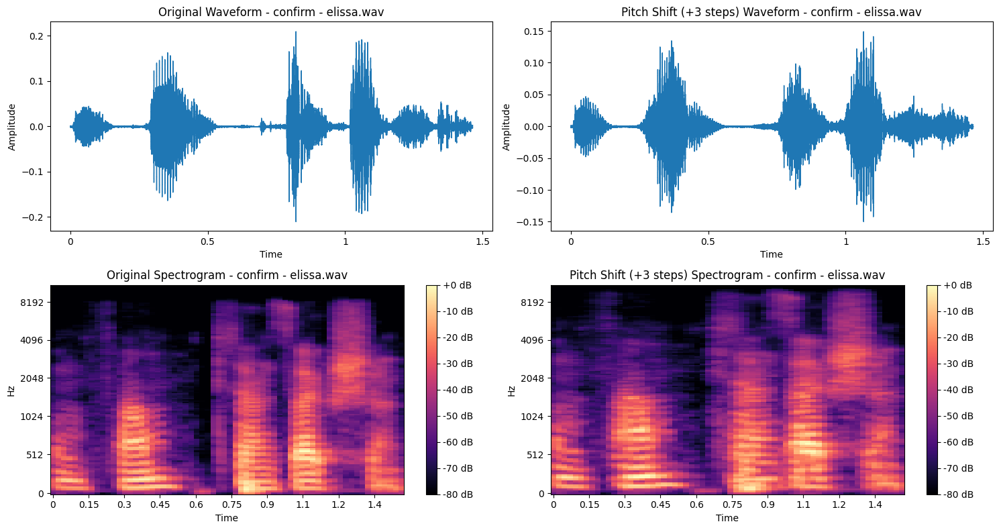

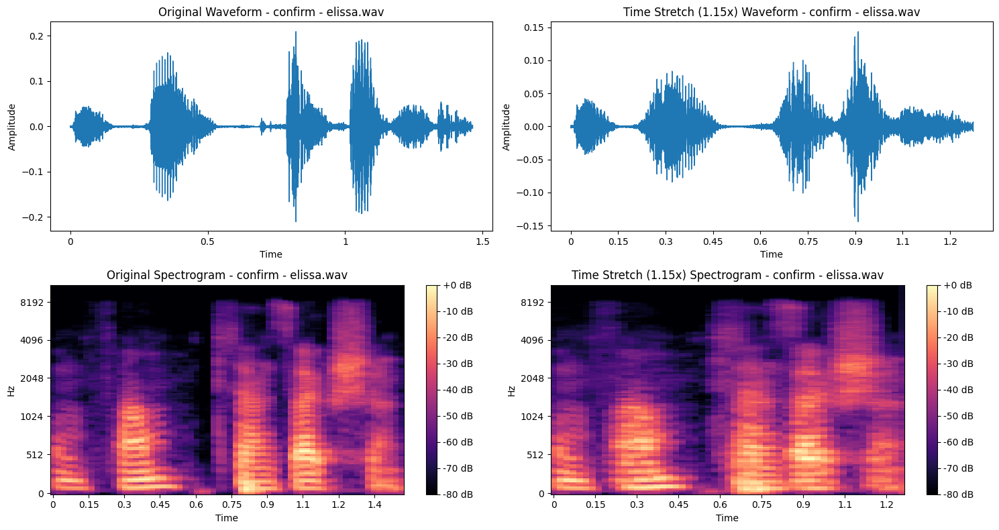

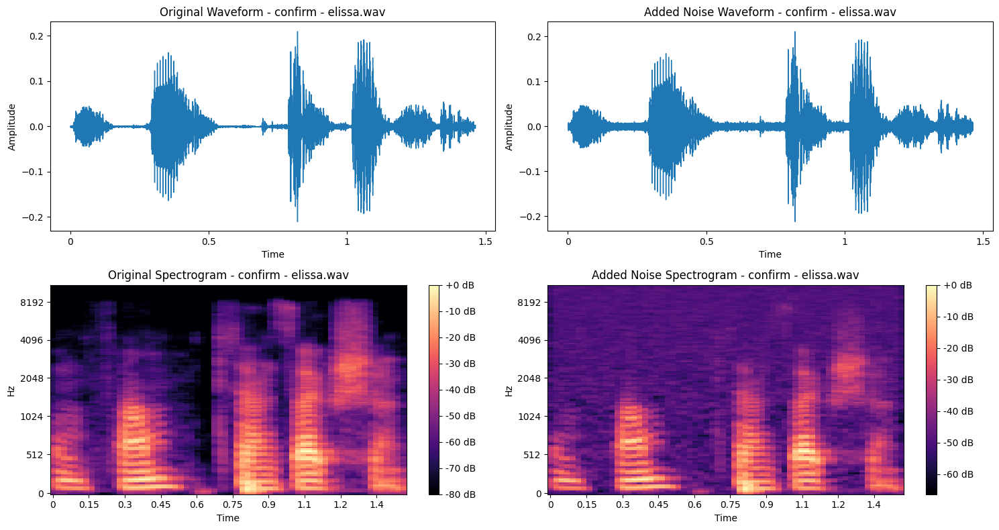

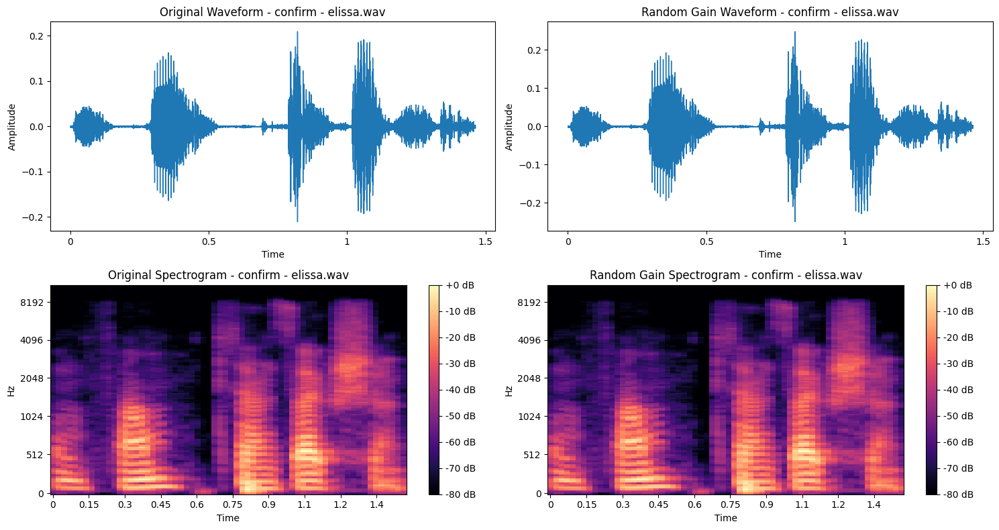

✓ Augmented: confirm - elissa.wav (4 variations created)

--- Processing: confirm - terry.wav ---
Original length: 3.22s → Trimmed length: 1.32s


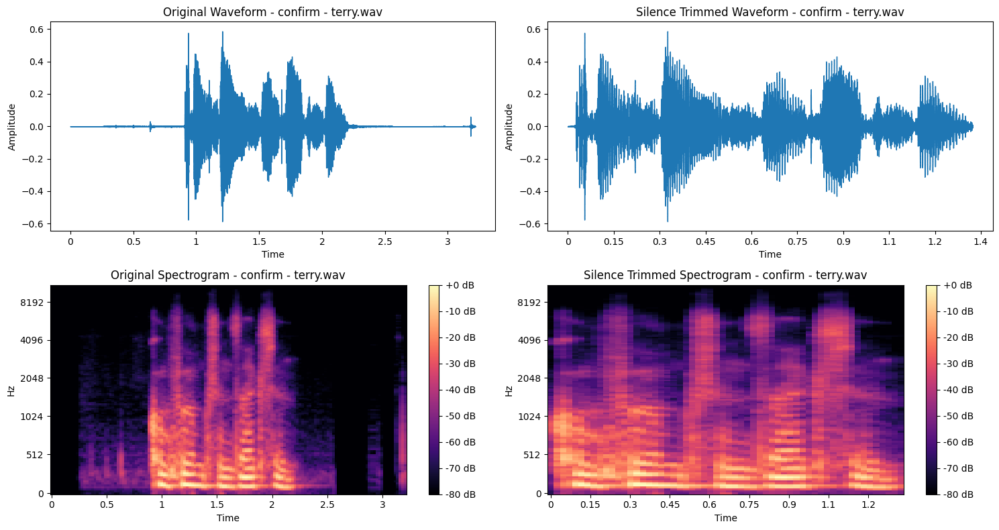

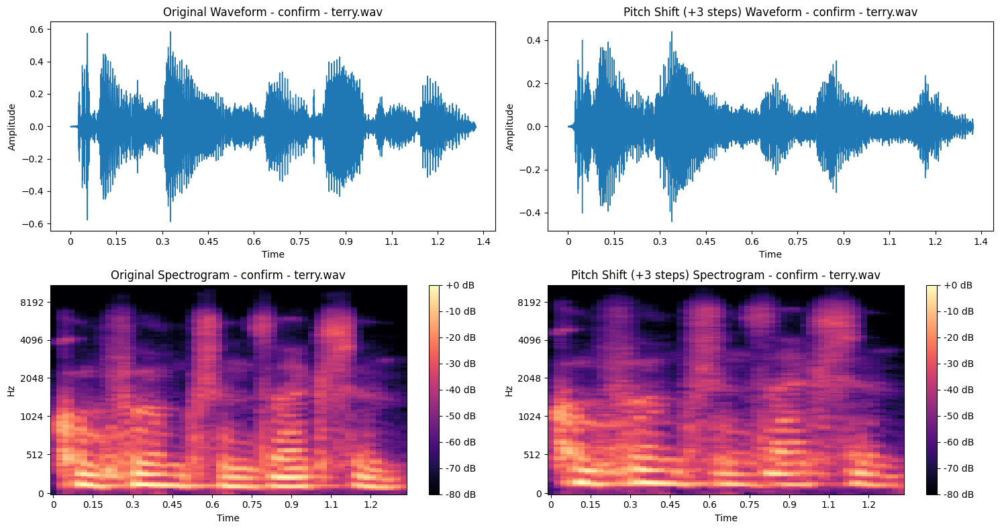

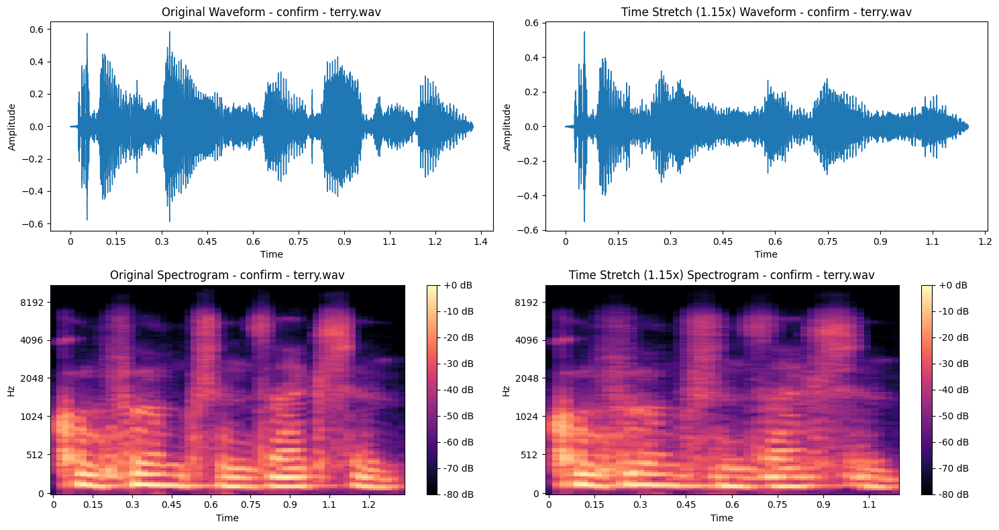

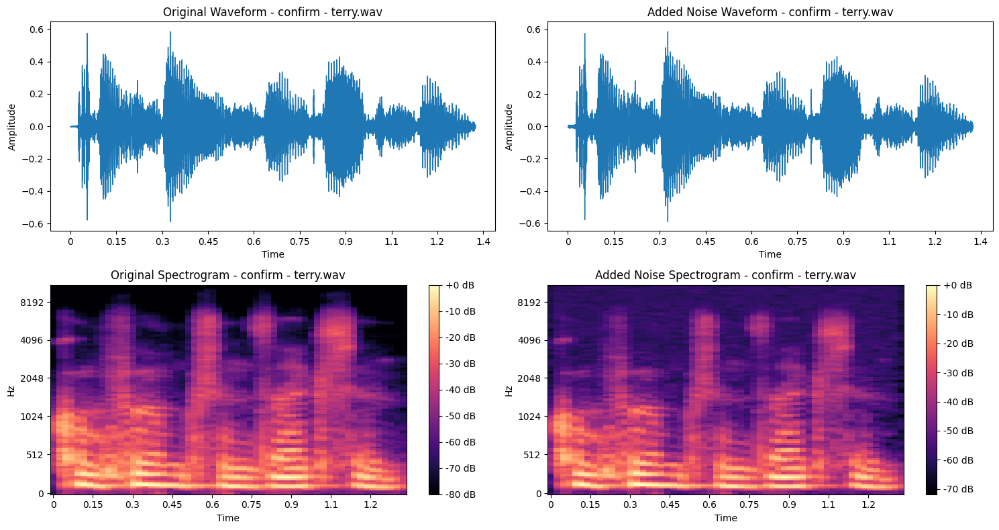

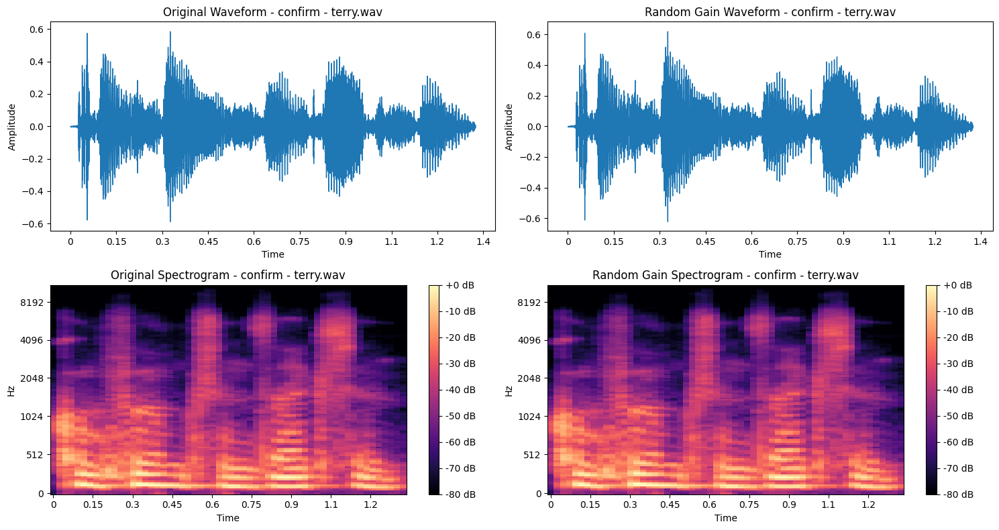

✓ Augmented: confirm - terry.wav (4 variations created)


In [4]:
# ============ STEP 3: AUDIO PREPROCESSING & AUGMENTATION ============
def trim_silence(y, sr, top_db=20):
    """Remove silence from beginning and end of audio"""
    y_trimmed, _ = librosa.effects.trim(y, top_db=top_db)
    return y_trimmed

def augment_pitch_shift(y, sr, n_steps=4):
    """Augmentation: Pitch shift"""
    return librosa.effects.pitch_shift(y, sr=sr, n_steps=n_steps)

def augment_time_stretch(y, rate=1.2):
    """Augmentation: Time stretch"""
    return librosa.effects.time_stretch(y, rate=rate)

def augment_add_noise(y, noise_factor=0.005):
    """Augmentation: Add background noise"""
    noise = np.random.randn(len(y))
    return y + noise_factor * noise

def augment_random_gain(y, gain_range=(0.8, 1.2)):
    """Augmentation: Random gain adjustment"""
    gain = np.random.uniform(gain_range[0], gain_range[1])
    return y * gain

def visualize_before_after(y_original, y_augmented, sr, title, aug_type):
    """Visualize original vs augmented audio"""
    fig, axes = plt.subplots(2, 2, figsize=(15, 8))

    # Original waveform
    axes[0, 0].set_title(f'Original Waveform - {title}')
    librosa.display.waveshow(y_original, sr=sr, ax=axes[0, 0])
    axes[0, 0].set_ylabel('Amplitude')

    # Augmented waveform
    axes[0, 1].set_title(f'{aug_type} Waveform - {title}')
    librosa.display.waveshow(y_augmented, sr=sr, ax=axes[0, 1])
    axes[0, 1].set_ylabel('Amplitude')

    # Original spectrogram
    S_orig = librosa.feature.melspectrogram(y=y_original, sr=sr)
    S_orig_db = librosa.power_to_db(S_orig, ref=np.max)
    axes[1, 0].set_title(f'Original Spectrogram - {title}')
    img1 = librosa.display.specshow(S_orig_db, sr=sr, x_axis='time', y_axis='mel', ax=axes[1, 0])
    fig.colorbar(img1, ax=axes[1, 0], format='%+2.0f dB')

    # Augmented spectrogram
    S_aug = librosa.feature.melspectrogram(y=y_augmented, sr=sr)
    S_aug_db = librosa.power_to_db(S_aug, ref=np.max)
    axes[1, 1].set_title(f'{aug_type} Spectrogram - {title}')
    img2 = librosa.display.specshow(S_aug_db, sr=sr, x_axis='time', y_axis='mel', ax=axes[1, 1])
    fig.colorbar(img2, ax=axes[1, 1], format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

# Apply preprocessing and augmentations to all files
print("\n=== APPLYING PREPROCESSING & AUGMENTATIONS ===")
augmented_data = {}

for filename in sorted(os.listdir('recordings')):
    if not filename.endswith('.wav'):
        continue

    filepath = f'recordings/{filename}'
    y, sr = librosa.load(filepath, sr=22050)

    print(f"\n--- Processing: {filename} ---")

    # Step 1: Trim silence
    y_trimmed = trim_silence(y, sr, top_db=20)
    print(f"Original length: {len(y)/sr:.2f}s → Trimmed length: {len(y_trimmed)/sr:.2f}s")

    # Visualize trimming effect
    visualize_before_after(y, y_trimmed, sr, filename, "Silence Trimmed")

    # Store trimmed version as base
    augmented_data[filename] = {'original': y_trimmed}

    # Apply augmentation 1: Pitch shift
    y_pitch = augment_pitch_shift(y_trimmed, sr, n_steps=3)
    augmented_data[filename]['pitch_shift'] = y_pitch
    visualize_before_after(y_trimmed, y_pitch, sr, filename, "Pitch Shift (+3 steps)")

    # Apply augmentation 2: Time stretch
    y_time = augment_time_stretch(y_trimmed, rate=1.15)
    augmented_data[filename]['time_stretch'] = y_time
    visualize_before_after(y_trimmed, y_time, sr, filename, "Time Stretch (1.15x)")

    # Apply augmentation 3: Add noise
    y_noise = augment_add_noise(y_trimmed, noise_factor=0.003)
    augmented_data[filename]['add_noise'] = y_noise
    visualize_before_after(y_trimmed, y_noise, sr, filename, "Added Noise")

    # Apply augmentation 4: Random gain
    y_gain = augment_random_gain(y_trimmed)
    augmented_data[filename]['gain'] = y_gain
    visualize_before_after(y_trimmed, y_gain, sr, filename, "Random Gain")

    print(f"✓ Augmented: {filename} (4 variations created)")


In [5]:
# ============ STEP 4: FEATURE EXTRACTION ============
def extract_mfcc(y, sr, n_mfcc=13):
    """Extract MFCC features"""
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
    return np.mean(mfcc, axis=1), np.std(mfcc, axis=1)

def extract_spectral_rolloff(y, sr):
    """Extract spectral roll-off"""
    rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
    return np.mean(rolloff), np.std(rolloff)

def extract_energy(y):
    """Extract energy features"""
    energy = np.sum(y**2)
    return energy, np.std(y)

def extract_zero_crossing_rate(y):
    """Extract zero crossing rate"""
    zcr = librosa.feature.zero_crossing_rate(y)[0]
    return np.mean(zcr), np.std(zcr)

def extract_spectral_centroid(y, sr):
    """Extract spectral centroid"""
    centroid = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    return np.mean(centroid), np.std(centroid)

def extract_all_features(y, sr):
    """Extract all features from audio signal"""
    features = {}

    # MFCC
    mfcc_mean, mfcc_std = extract_mfcc(y, sr)
    for i in range(len(mfcc_mean)):
        features[f'mfcc_{i}_mean'] = mfcc_mean[i]
        features[f'mfcc_{i}_std'] = mfcc_std[i]

    # Spectral roll-off
    rolloff_mean, rolloff_std = extract_spectral_rolloff(y, sr)
    features['spectral_rolloff_mean'] = rolloff_mean
    features['spectral_rolloff_std'] = rolloff_std

    # Energy
    energy, energy_std = extract_energy(y)
    features['energy'] = energy
    features['energy_std'] = energy_std

    # Zero crossing rate
    zcr_mean, zcr_std = extract_zero_crossing_rate(y)
    features['zcr_mean'] = zcr_mean
    features['zcr_std'] = zcr_std

    # Spectral centroid
    centroid_mean, centroid_std = extract_spectral_centroid(y, sr)
    features['spectral_centroid_mean'] = centroid_mean
    features['spectral_centroid_std'] = centroid_std

    return features

In [6]:
# ============ STEP 5: PROCESS AND SAVE FEATURES ============
print("\n=== EXTRACTING FEATURES ===")
all_features = []

for filename, versions in augmented_data.items():
    # Extract member name and phrase from filename
    # Format: approve_alli.wav, confirm_terry.wav, etc.
    parts = filename.replace('.wav', '').split('_')
    phrase = parts[0]  # "approve" or "confirm"
    member = '_'.join(parts[1:])  # member name

    for aug_type, audio_signal in versions.items():
        y_aug = audio_signal
        sr = 22050

        # Extract features
        features = extract_all_features(y_aug, sr)

        # Add metadata
        features['filename'] = filename
        features['member'] = member
        features['phrase'] = phrase
        features['augmentation'] = aug_type

        all_features.append(features)
        print(f"✓ Extracted features: {filename} - {aug_type}")


=== EXTRACTING FEATURES ===
✓ Extracted features: approve - alli.wav - original
✓ Extracted features: approve - alli.wav - pitch_shift
✓ Extracted features: approve - alli.wav - time_stretch
✓ Extracted features: approve - alli.wav - add_noise
✓ Extracted features: approve - alli.wav - gain
✓ Extracted features: approve - ange.wav - original
✓ Extracted features: approve - ange.wav - pitch_shift
✓ Extracted features: approve - ange.wav - time_stretch
✓ Extracted features: approve - ange.wav - add_noise
✓ Extracted features: approve - ange.wav - gain
✓ Extracted features: approve - elissa.wav - original
✓ Extracted features: approve - elissa.wav - pitch_shift
✓ Extracted features: approve - elissa.wav - time_stretch
✓ Extracted features: approve - elissa.wav - add_noise
✓ Extracted features: approve - elissa.wav - gain
✓ Extracted features: approve - terry.wav - original
✓ Extracted features: approve - terry.wav - pitch_shift
✓ Extracted features: approve - terry.wav - time_stretch
✓ E

In [7]:
# ============ STEP 6: SAVE TO CSV ============
df = pd.DataFrame(all_features)

# Reorder columns for clarity
cols = ['filename', 'member', 'phrase', 'augmentation'] + \
       [col for col in df.columns if col not in ['filename', 'member', 'phrase', 'augmentation']]
df = df[cols]

# Save to CSV
df.to_csv('audio_features.csv', index=False)
print(f"\n✓ Features saved to audio_features.csv")
print(f"Shape: {df.shape}")
print(f"\nFirst few rows:")
print(df.head())

# Summary statistics
print(f"\nDataset Summary:")
print(df[['member', 'phrase', 'augmentation']].value_counts())

# Download the CSV file
files.download('audio_features.csv')


✓ Features saved to audio_features.csv
Shape: (40, 38)

First few rows:
             filename member          phrase  augmentation  mfcc_0_mean  \
0  approve - alli.wav         approve - alli      original  -431.792847   
1  approve - alli.wav         approve - alli   pitch_shift  -452.528046   
2  approve - alli.wav         approve - alli  time_stretch  -458.344604   
3  approve - alli.wav         approve - alli     add_noise  -316.180465   
4  approve - alli.wav         approve - alli          gain  -438.733582   

   mfcc_0_std  mfcc_1_mean  mfcc_1_std  mfcc_2_mean  mfcc_2_std  ...  \
0   81.866554   114.076118   58.079704     4.398787   25.045074  ...   
1   82.243347   106.833260   53.934021    12.386305   31.509121  ...   
2   82.859818   112.866737   56.939941     8.074197   24.313139  ...   
3   37.132565    38.958236   33.910740    24.578720   11.580462  ...   
4   81.866554   114.076118   58.079708     4.398783   25.045078  ...   

   mfcc_12_mean  mfcc_12_std  spectral_roll

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>